In [1]:
# # This Python 3 environment comes with many helpful analytics libraries installed
# # It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# # For example, here's several helpful packages to load

# import numpy as np # linear algebra
# import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# # Input data files are available in the read-only "../input/" directory
# # For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

# import os
# for dirname, _, filenames in os.walk('/kaggle/input'):
#     for filename in filenames:
#         print(os.path.join(dirname, filename))

# # You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# # You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [2]:
!nvidia-smi
!nvcc --version

import torch
print(torch.__version__)
import torchvision
print(torchvision.__version__)

#!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu110/torch1.7/index.html
#!pip uninstall --yes detectron2 


Thu Oct  7 04:56:12 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 450.119.04   Driver Version: 450.119.04   CUDA Version: 11.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   36C    P0    29W / 250W |      0MiB / 16280MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [3]:
!python -m pip -q install 'git+https://github.com/facebookresearch/detectron2.git'


In [4]:
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import cv2
import matplotlib.pyplot as plt

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog


In [5]:
import os
len(os.listdir('../input/d/arunkumarnayak/carpartstraintest/train')),len(os.listdir('../input/d/arunkumarnayak/carpartstraintest/test'))


(11426, 286)

In [6]:
from detectron2.data.datasets import register_coco_instances
register_coco_instances("car_part_train", {}, "../input/d/arunkumarnayak/carpartstraintest/train.json", "../input/d/arunkumarnayak/carpartstraintest/train")

In [7]:
register_coco_instances("car_part_test", {}, "../input/d/arunkumarnayak/carpartstraintest/test.json", "../input/d/arunkumarnayak/carpartstraintest/test")
car_part_test_metadata = MetadataCatalog.get("car_part_test")

dataset_dicts_test = DatasetCatalog.get("car_part_test")


[10/07 04:58:34 d2.data.datasets.coco]: Loaded 286 images in COCO format from ../input/d/arunkumarnayak/carpartstraintest/test.json


In [8]:
car_part_train_metadata = MetadataCatalog.get("car_part_train")


In [9]:
dataset_dicts = DatasetCatalog.get("car_part_train")


[10/07 04:58:38 d2.data.datasets.coco]: Loading ../input/d/arunkumarnayak/carpartstraintest/train.json takes 3.42 seconds.
[10/07 04:58:38 d2.data.datasets.coco]: Loaded 11426 images in COCO format from ../input/d/arunkumarnayak/carpartstraintest/train.json


In [10]:
!git clone https://github.com/facebookresearch/detectron2 detectron2_repo


Cloning into 'detectron2_repo'...
remote: Enumerating objects: 13179, done.
remote: Counting objects: 100% (680/680), done.
remote: Compressing objects: 100% (350/350), done.
remote: Total 13179 (delta 398), reused 535 (delta 326), pack-reused 12499
Receiving objects: 100% (13179/13179), 5.67 MiB | 9.16 MiB/s, done.
Resolving deltas: 100% (9354/9354), done.


../input/d/arunkumarnayak/carpartstraintest/train/4176.jpg


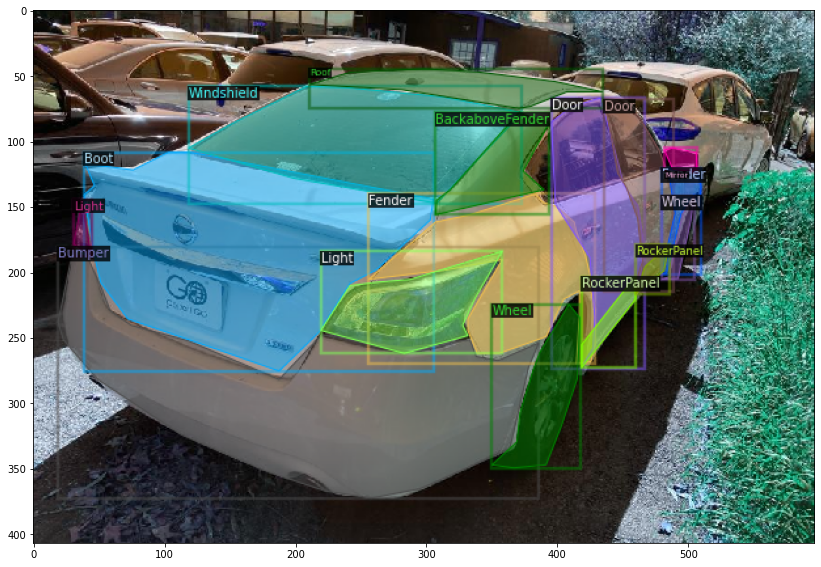

../input/d/arunkumarnayak/carpartstraintest/train/18532.jpg


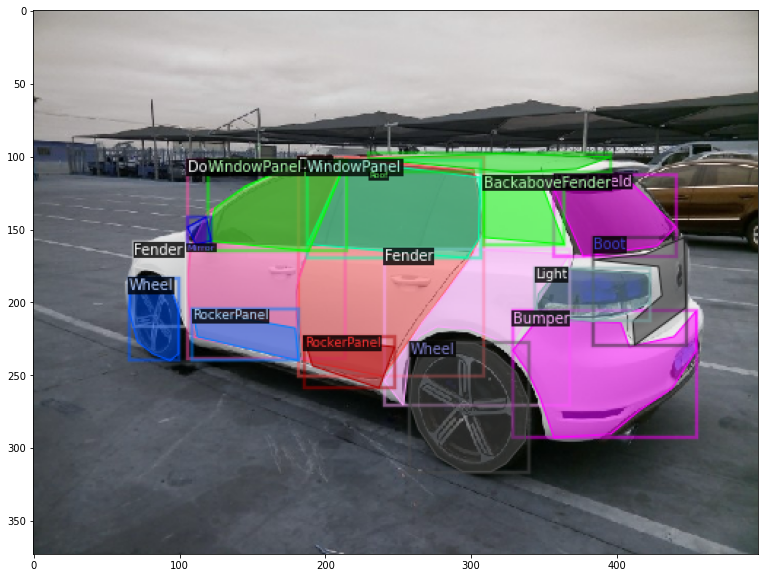

../input/d/arunkumarnayak/carpartstraintest/train/ca748c28-def5-11ea-8422-0242ac13000320200815-124943.jpg


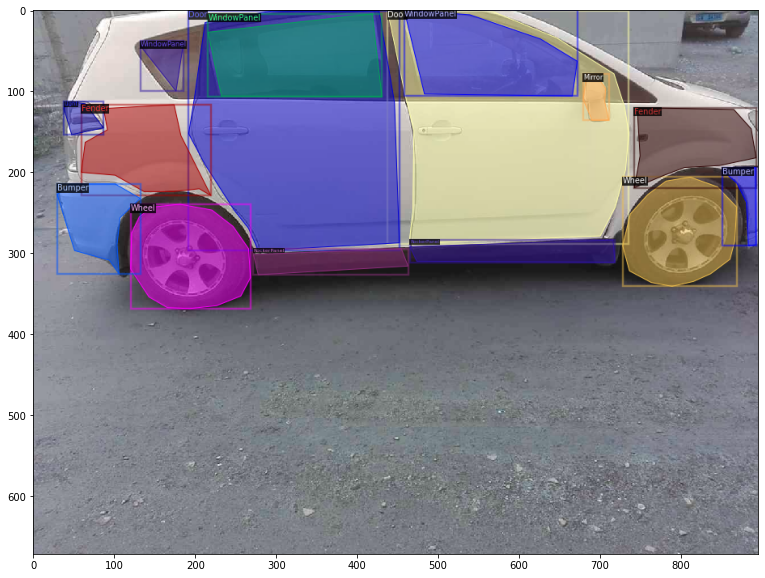

In [11]:
import random
for d in random.sample(dataset_dicts, 3):
    print(d["file_name"])
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=car_part_train_metadata, scale=0.7)
    vis = visualizer.draw_dataset_dict(d)
    plt.figure(figsize = (14, 10))
    plt.imshow(vis.get_image()[:, :, ::-1])
    plt.show()


In [12]:
from detectron2.engine import DefaultTrainer


In [13]:
cfg = get_cfg()
cfg.merge_from_file(
    "./detectron2_repo/configs/COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"
)
cfg.DATASETS.TRAIN = ("car_part_train",)
cfg.DATASETS.TEST = ()  # no metrics implemented for this dataset
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = "../input/modelfinal5/model_final-5.pth"  # initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 6
cfg.SOLVER.BASE_LR = 0.0001
cfg.SOLVER.MAX_ITER = (
    10000
)  # 300 iterations seems good enough, but you can certainly train longer
cfg.SOLVER.LR_POLICY='exp_decay'
cfg.SOLVER.GAMMA = 0.1



cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = (
    128
)  # faster, and good enough for this toy dataset
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 17  # 3 classes (data, fig, hazelnut)

In [14]:
from detectron2.data import DatasetCatalog, MetadataCatalog, build_detection_test_loader
from detectron2.evaluation import COCOEvaluator, inference_on_dataset

class CocoTrainer(DefaultTrainer):
    @classmethod
    def build_evaluator(cls, cfg, dataset_name, output_folder=None):
        if output_folder is None:
            os.makedirs("coco_eval", exist_ok=True)
            output_folder = "coco_eval"
        
        return COCOEvaluator(dataset_name, cfg, True, output_folder)

In [15]:
#cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "../input/model-final1/model_final-1.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7   # set the testing threshold for this model
cfg.DATASETS.TEST = ("car_part_train", )
predictor = DefaultPredictor(cfg)

/opt/conda/lib/python3.7/site-packages/detectron2/modeling/roi_heads/fast_rcnn.py:154: UserWarning: This overload of nonzero is deprecated:
	nonzero()
Consider using one of the following signatures instead:
	nonzero(*, bool as_tuple) (Triggered internally at  /opt/conda/conda-bld/pytorch_1603729047590/work/torch/csrc/utils/python_arg_parser.cpp:882.)
  filter_inds = filter_mask.nonzero()


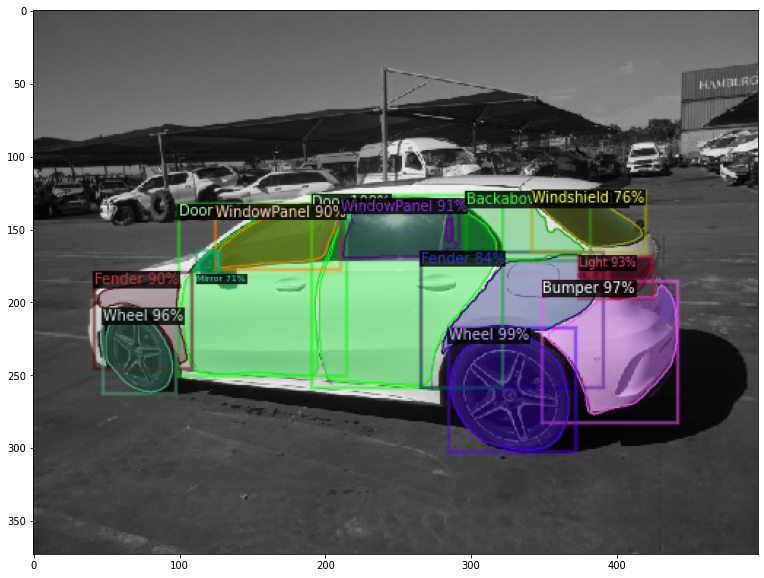

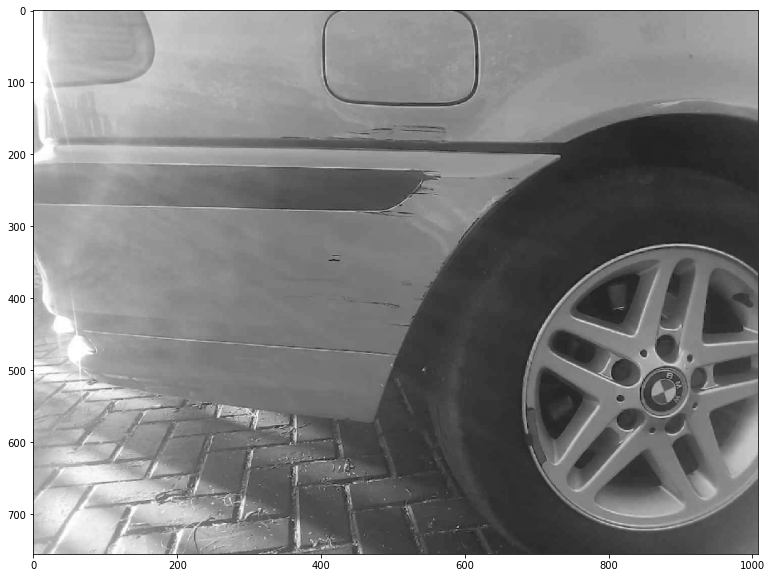

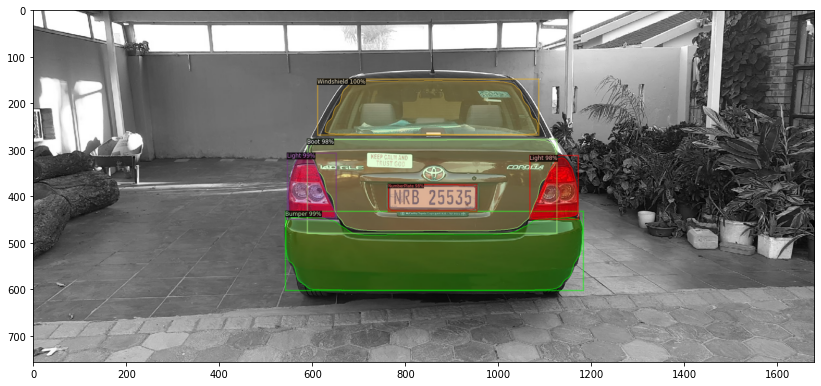

In [16]:
from detectron2.utils.visualizer import ColorMode
import random
import cv2

for d in random.sample(dataset_dicts, 3):    
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)
    v = Visualizer(im[:, :, ::-1],
                   metadata=car_part_train_metadata, 
                   scale=0.7, 
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels
    )
    v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    plt.figure(figsize = (14, 10))
    plt.imshow(cv2.cvtColor(v.get_image()[:, :, ::-1], cv2.COLOR_BGR2RGB))
    plt.show()


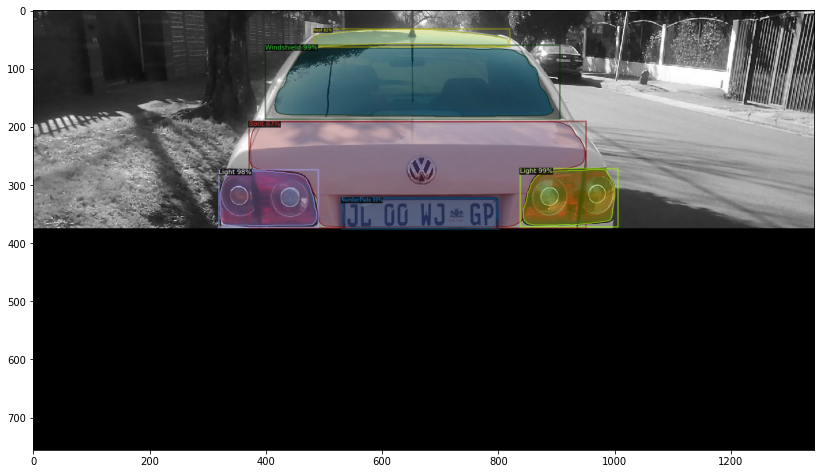

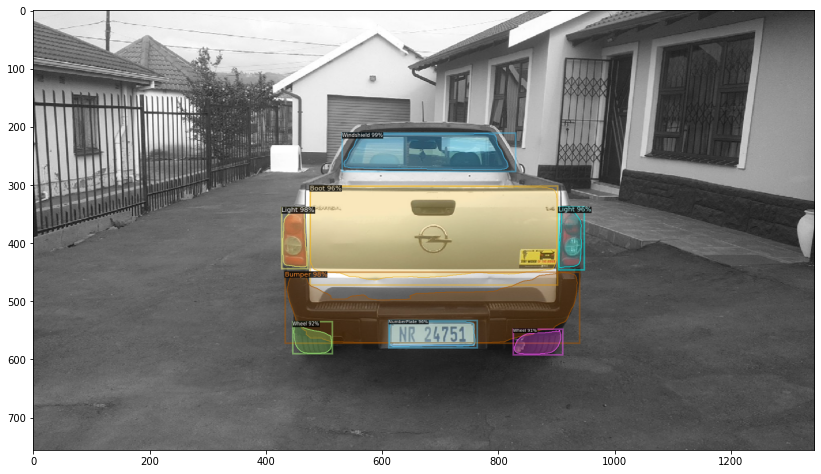

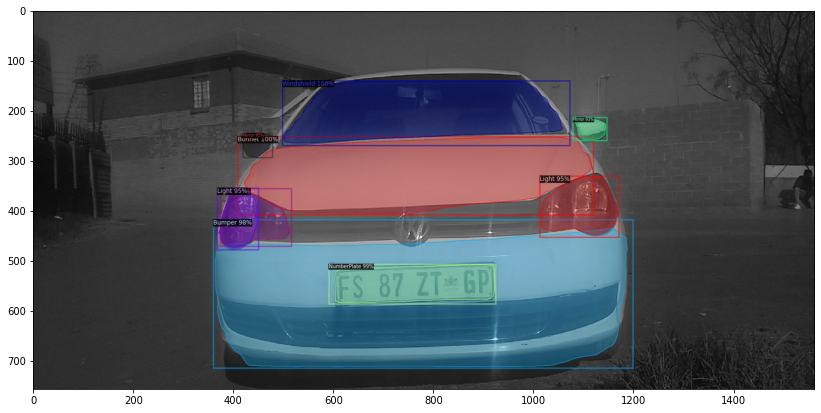

In [17]:
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7   # set the testing threshold for this model
cfg.DATASETS.TEST = ("car_part_test", )
predictor = DefaultPredictor(cfg)

for d in random.sample(dataset_dicts_test, 3):    
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)
    v = Visualizer(im[:, :, ::-1],
                   metadata=car_part_test_metadata, 
                   scale=0.7, 
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels
    )
    v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    plt.figure(figsize = (14, 10))
    plt.imshow(cv2.cvtColor(v.get_image()[:, :, ::-1], cv2.COLOR_BGR2RGB))
    plt.show()


In [18]:
cfg.DATASETS.TEST = ()

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = CocoTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()


[10/07 04:59:01 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

In [19]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7   # set the testing threshold for this model
cfg.DATASETS.TEST = ("car_part_train", )
predictor = DefaultPredictor(cfg)

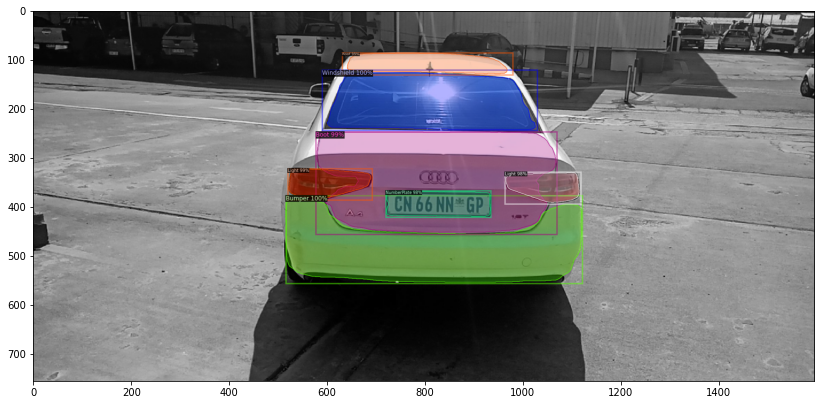

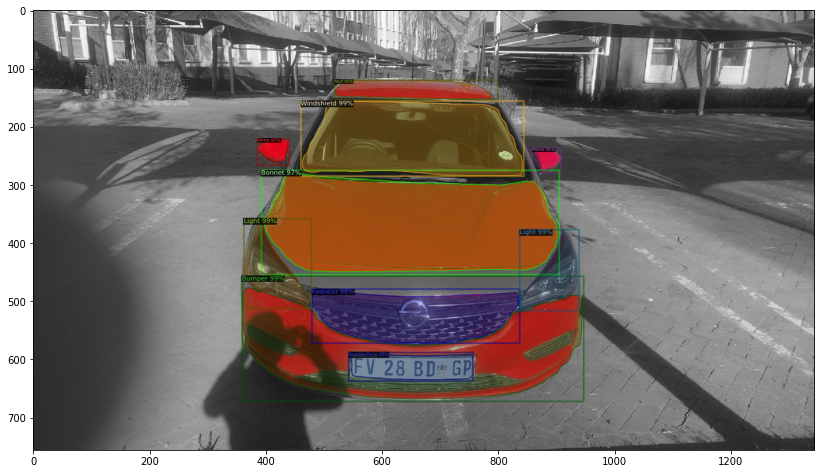

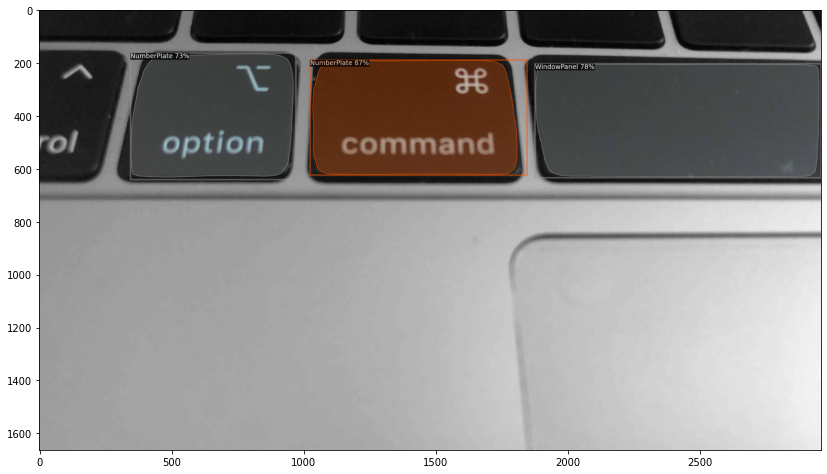

In [20]:
for d in random.sample(dataset_dicts, 3):    
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)
    v = Visualizer(im[:, :, ::-1],
                   metadata=car_part_train_metadata, 
                   scale=0.7, 
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels
    )
    v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    plt.figure(figsize = (14, 10))
    plt.imshow(cv2.cvtColor(v.get_image()[:, :, ::-1], cv2.COLOR_BGR2RGB))
    plt.show()


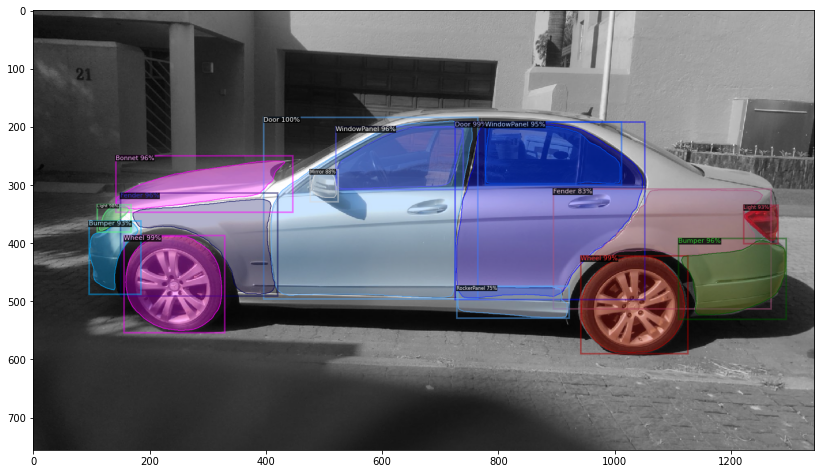

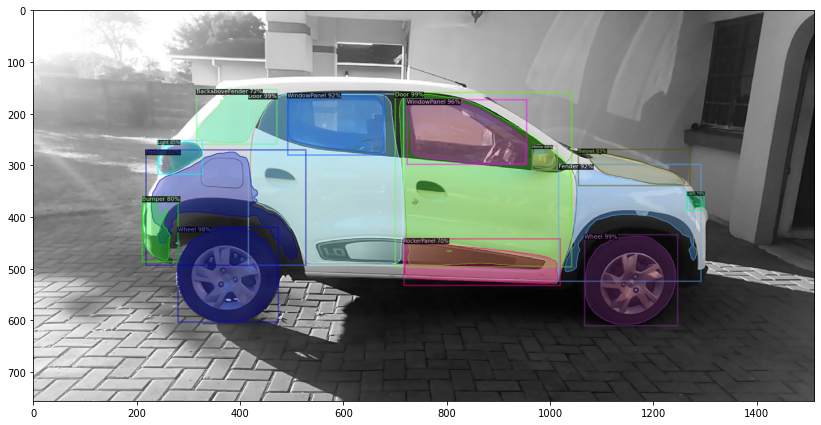

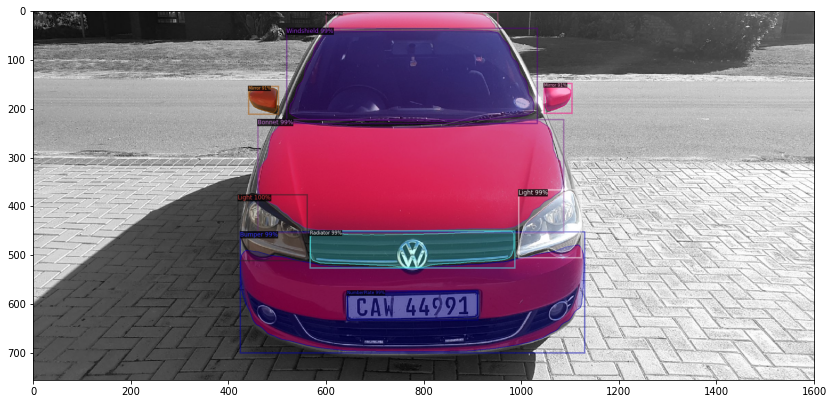

In [21]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7   # set the testing threshold for this model
cfg.DATASETS.TEST = ("car_part_test", )
predictor = DefaultPredictor(cfg)

for d in random.sample(dataset_dicts_test, 3):    
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)
    v = Visualizer(im[:, :, ::-1],
                   metadata=car_part_test_metadata, 
                   scale=0.7, 
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels
    )
    v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    plt.figure(figsize = (14, 10))
    plt.imshow(cv2.cvtColor(v.get_image()[:, :, ::-1], cv2.COLOR_BGR2RGB))
    plt.show()


In [22]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.70
predictor = DefaultPredictor(cfg)

if os.path.isdir('./output/test_evaluation')==False:
    os.mkdir('./output/test_evaluation')


evaluator = COCOEvaluator("car_part_test", cfg, True, output_dir="./output/test_evaluation")
val_loader = build_detection_test_loader(cfg, "car_part_test")
inference_on_dataset(trainer.model, val_loader, evaluator)


WARNING [10/07 10:29:45 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
[10/07 10:29:46 d2.data.datasets.coco]: Loaded 286 images in COCO format from ../input/d/arunkumarnayak/carpartstraintest/test.json
[10/07 10:29:46 d2.data.build]: Distribution of instances among all 16 categories:
|   category    | #instances   |  category   | #instances   |  category   | #instances   |
|:-------------:|:-------------|:-----------:|:-------------|:-----------:|:-------------|
|    Bumper     | 362          |    Light    | 504          | NumberPlate | 147          |
|   Radiator    | 74           |   Bonnet    | 179          | Windshield  | 230          |
|    Mirror     | 261          |    Wheel    | 294          |    Door     | 254          |
|  RockerPanel  | 195          | WindowPanel | 343          | Spare Wheel | 2            |
|     Boot      | 98           |   Fender    | 321          |    Roof

OrderedDict([('bbox',
              {'AP': 44.83047403036643,
               'AP50': 65.02873186210869,
               'AP75': 51.39529327820279,
               'APs': 6.336633663366337,
               'APm': 19.135951441626766,
               'APl': 47.389415229041866,
               'AP-Bumper': 60.44969000974889,
               'AP-Light': 62.10107249696474,
               'AP-NumberPlate': 64.59295094110328,
               'AP-Radiator': 51.13895047152764,
               'AP-Bonnet': 54.54888448862785,
               'AP-Windshield': 59.911697046071374,
               'AP-Mirror': 43.117019774151835,
               'AP-Wheel': 68.83643417674614,
               'AP-Door': 81.99400878263724,
               'AP-RockerPanel': 0.9618462877311378,
               'AP-WindowPanel': 47.28471982558787,
               'AP-Spare Wheel': 0.0,
               'AP-Boot': 61.501779559820044,
               'AP-Fender': 36.664504368217635,
               'AP-Roof': 22.370542710770493,
              

In [23]:
# cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
# cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.50
# predictor = DefaultPredictor(cfg)

# if os.path.isdir('./output/train_evaluation')==False:
#     os.mkdir('./output/train_evaluation')


# evaluator = COCOEvaluator("car_part_train", cfg, True, output_dir="./output/train_evaluation")
# val_loader = build_detection_test_loader(cfg, "car_part_train")
# inference_on_dataset(trainer.model, val_loader, evaluator)


['../input/d/arunkumarnayak/carpartstraintest/val/img16.jpg', '../input/d/arunkumarnayak/carpartstraintest/val/img9.jpg', '../input/d/arunkumarnayak/carpartstraintest/val/img2.jpg', '../input/d/arunkumarnayak/carpartstraintest/val/img7.jpg', '../input/d/arunkumarnayak/carpartstraintest/val/img12.jpg', '../input/d/arunkumarnayak/carpartstraintest/val/img10.jpg', '../input/d/arunkumarnayak/carpartstraintest/val/img15.jpg', '../input/d/arunkumarnayak/carpartstraintest/val/img14.jpg', '../input/d/arunkumarnayak/carpartstraintest/val/img5.jpg', '../input/d/arunkumarnayak/carpartstraintest/val/img3.jpg', '../input/d/arunkumarnayak/carpartstraintest/val/img4.jpg', '../input/d/arunkumarnayak/carpartstraintest/val/img6.jpg', '../input/d/arunkumarnayak/carpartstraintest/val/img13.jpg', '../input/d/arunkumarnayak/carpartstraintest/val/img1.jpg', '../input/d/arunkumarnayak/carpartstraintest/val/img11.jpg', '../input/d/arunkumarnayak/carpartstraintest/val/img8.jpg']


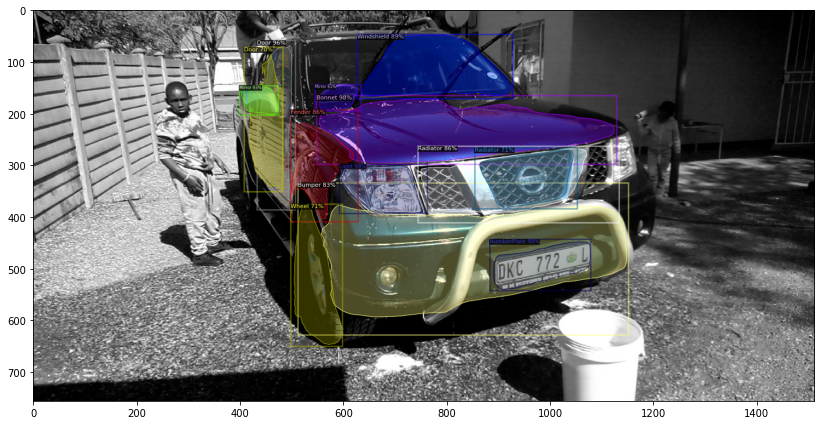

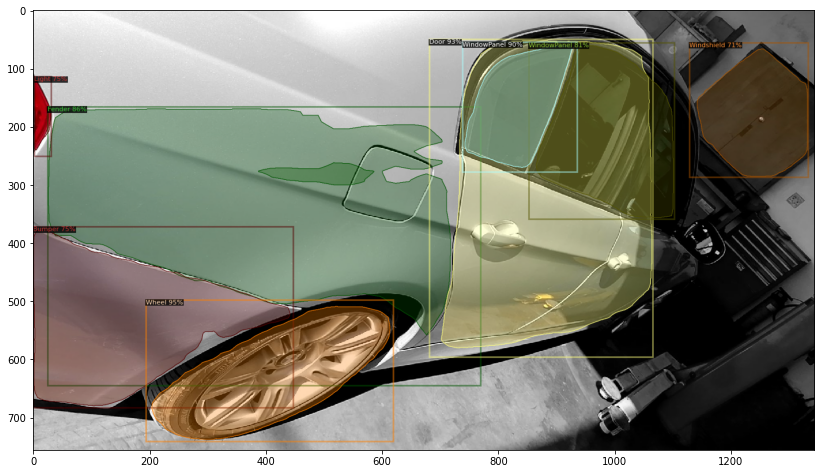

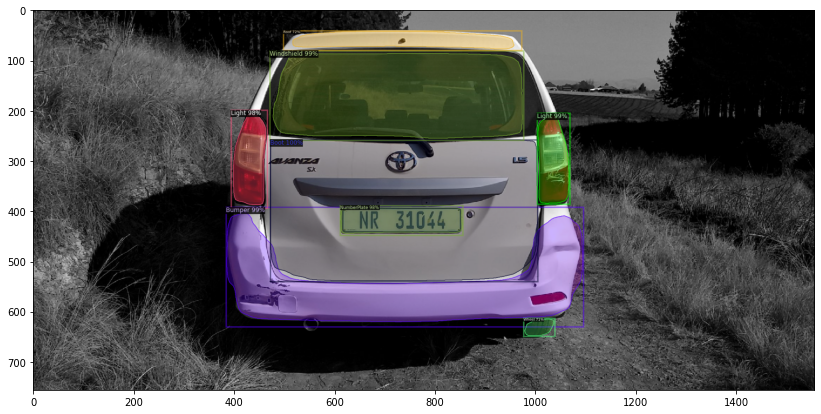

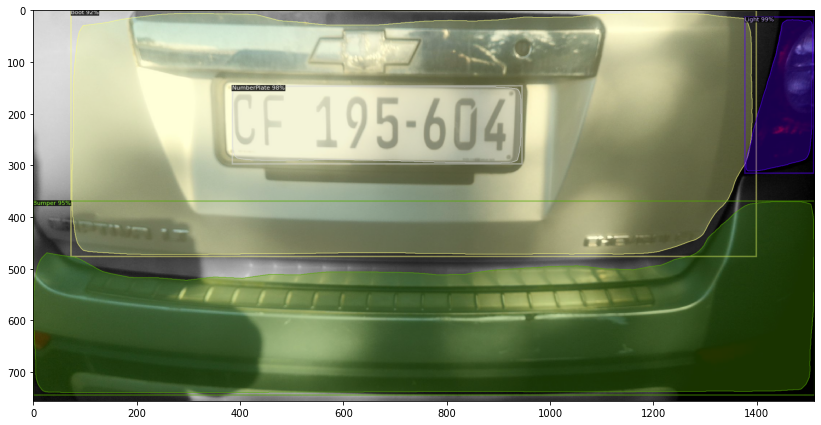

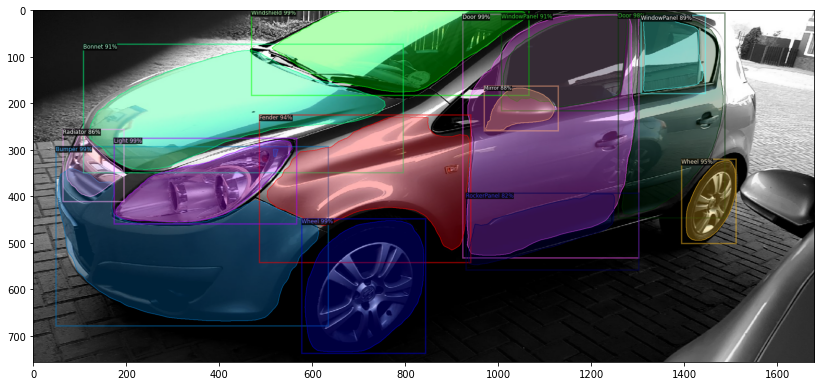

...

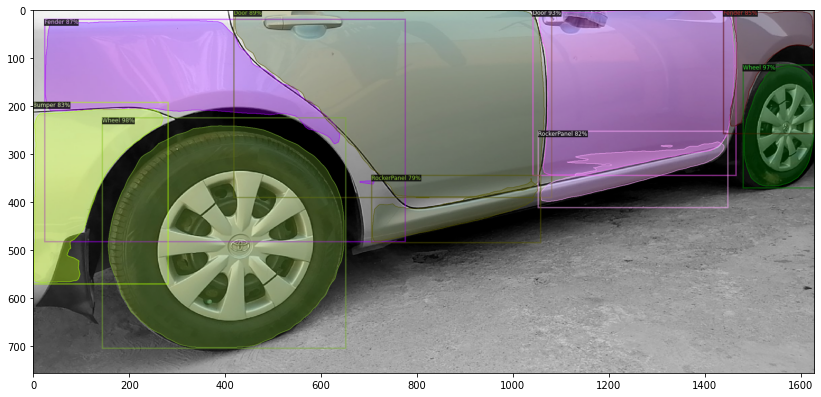

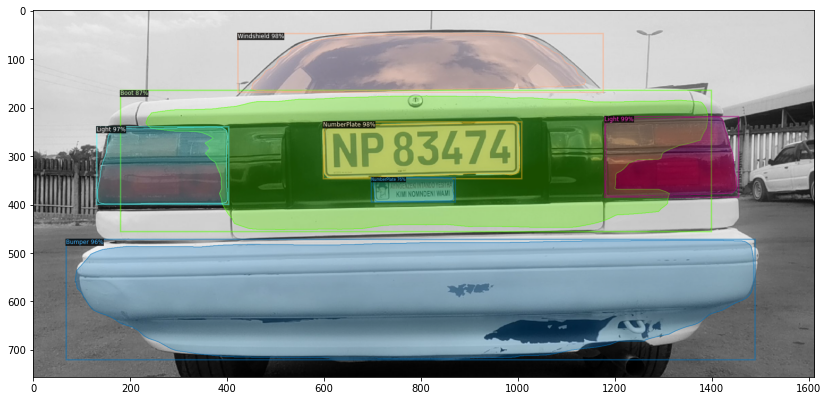

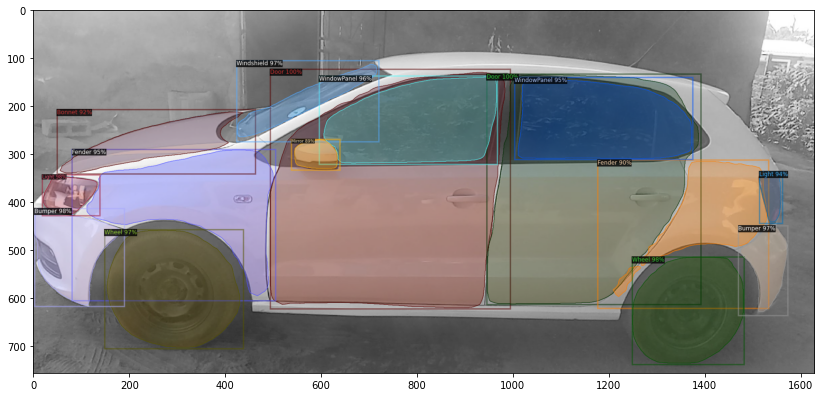

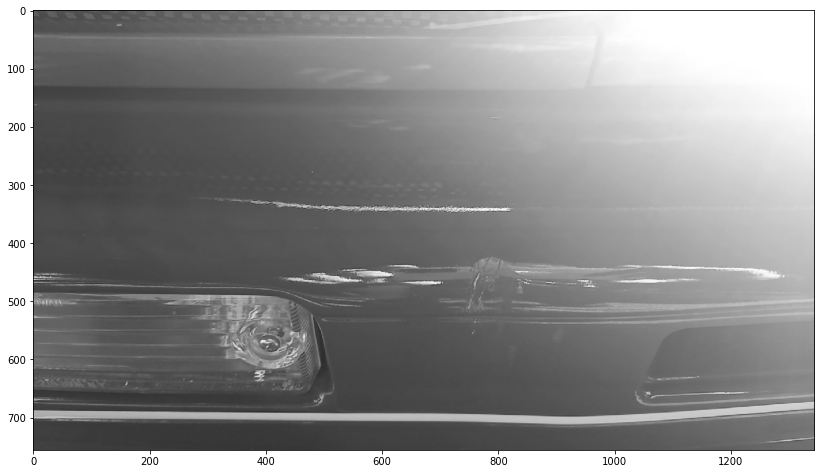

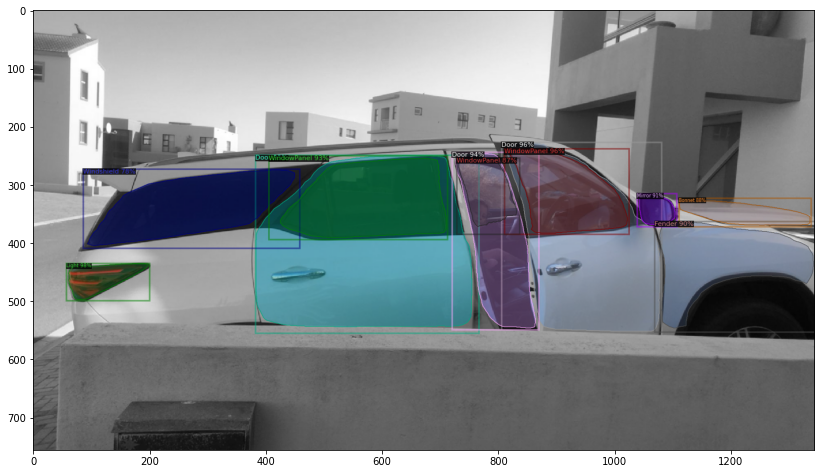

In [24]:
import glob
types = ('../input/d/arunkumarnayak/carpartstraintest/val/*.jpg', '../input/d/arunkumarnayak/carpartstraintest/val/*.jpeg',
         '../input/d/arunkumarnayak/carpartstraintest/val/*.png') # the tuple of file types
files_grabbed = []
for files in types:
    files_grabbed.extend(glob.glob(files))
print(files_grabbed)
for file in files_grabbed:
    im = cv2.imread(file)
    # print(im.shape)
    outputs = predictor(im)
    # print(outputs)
    v = Visualizer(im[:, :, ::-1],
                   metadata=car_part_test_metadata, 
                   scale=0.7, 
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels. This option is only available for segmentation models
    )
    #     out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    plt.figure(figsize = (14, 10))
    plt.imshow(cv2.cvtColor(v.get_image()[:, :, ::-1], cv2.COLOR_BGR2RGB))
    plt.show()

In [25]:
files_grabbed

['../input/d/arunkumarnayak/carpartstraintest/val/img16.jpg',
 '../input/d/arunkumarnayak/carpartstraintest/val/img9.jpg',
 '../input/d/arunkumarnayak/carpartstraintest/val/img2.jpg',
 '../input/d/arunkumarnayak/carpartstraintest/val/img7.jpg',
 '../input/d/arunkumarnayak/carpartstraintest/val/img12.jpg',
 '../input/d/arunkumarnayak/carpartstraintest/val/img10.jpg',
 '../input/d/arunkumarnayak/carpartstraintest/val/img15.jpg',
 '../input/d/arunkumarnayak/carpartstraintest/val/img14.jpg',
 '../input/d/arunkumarnayak/carpartstraintest/val/img5.jpg',
 '../input/d/arunkumarnayak/carpartstraintest/val/img3.jpg',
 '../input/d/arunkumarnayak/carpartstraintest/val/img4.jpg',
 '../input/d/arunkumarnayak/carpartstraintest/val/img6.jpg',
 '../input/d/arunkumarnayak/carpartstraintest/val/img13.jpg',
 '../input/d/arunkumarnayak/carpartstraintest/val/img1.jpg',
 '../input/d/arunkumarnayak/carpartstraintest/val/img11.jpg',
 '../input/d/arunkumarnayak/carpartstraintest/val/img8.jpg']

In [26]:
!kaggle datasets init -p ./
import json
key = {"username":"pavitargoyal","key":"11e3b5963433ce249371c0d0b543aab5"}
with open("/root/.kaggle/kaggle.json", 'w') as file:
    json.dump(key, file)
!chmod 600 /root/.kaggle/kaggle.json
!kaggle datasets init -p ./
with open('./dataset-metadata.json', 'r') as file:
    meta = json.load(file)
meta['title'] = "Detectron2Optimized checkpoints"
meta['id'] = "pavitargoyal/Detectron2OptimizedCheckpoints"
with open('./dataset-metadata.json', 'w') as file:
    json.dump(meta, file)
print(meta)


Traceback (most recent call last):
  File "/opt/conda/bin/kaggle", line 5, in <module>
    from kaggle.cli import main
  File "/opt/conda/lib/python3.7/site-packages/kaggle/__init__.py", line 23, in <module>
    api.authenticate()
  File "/opt/conda/lib/python3.7/site-packages/kaggle/api/kaggle_api_extended.py", line 166, in authenticate
    self.config_file, self.config_dir))
OSError: Could not find kaggle.json. Make sure it's located in /root/.kaggle. Or use the environment method.
Data package template written to: ./dataset-metadata.json
{'title': 'Detectron2Optimized checkpoints', 'id': 'pavitargoyal/Detectron2OptimizedCheckpoints', 'licenses': [{'name': 'CC0-1.0'}]}


In [27]:
#run this first time only
#!kaggle datasets create -p ./ --dir-mode tar

In [28]:
!kaggle datasets version -p ./ -m "new checkpoints" --dir-mode tar

Starting upload for file __notebook__.ipynb
100%|██████████████████████████████████████| 13.7M/13.7M [00:04<00:00, 3.44MB/s]
Upload successful: __notebook__.ipynb (14MB)
Starting upload for file detectron2_repo.tar
100%|██████████████████████████████████████| 10.4M/10.4M [00:04<00:00, 2.20MB/s]
Upload successful: detectron2_repo.tar (10MB)
Starting upload for file output.tar
100%|████████████████████████████████████████| 512M/512M [00:20<00:00, 26.1MB/s]
Upload successful: output.tar (512MB)
Dataset version is being created. Please check progress at https://www.kaggle.com/pavitargoyal/Detectron2OptimizedCheckpoints


In [29]:
# Testing on video

# Testing on videos

In [30]:
# import cv2
# import matplotlib.pyplot as plt


In [31]:
'''
  This function is designed for calculating the difference between two
  images. The images are convert it to an grey image and be resized to reduce the unnecessary calculating.
'''
# def Diff_img(img0, img):
#     img0 =  cv2.cvtColor(img0, cv2.COLOR_BGR2GRAY)
#     img =  cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
#     img0 = cv2.resize(img0, (320,200), interpolation = cv2.INTER_AREA)
#     img = cv2.resize(img, (320,200), interpolation = cv2.INTER_AREA)
#     # Calculate
#     Result = (abs(img - img0)).sum()
#     return Result

'\n  This function is designed for calculating the difference between two\n  images. The images are convert it to an grey image and be resized to reduce the unnecessary calculating.\n'

In [32]:
# if os.path.isdir('result')==False:
#     os.mkdir('result')
# if os.path.isdir('result/outputs')==False:
#     os.mkdir('result/outputs')

In [33]:
#shutil.rmtree('result/outputs/Video2')
#os.rmdir('result/outputs/Video1')
#os.mkdir('result/outputs/Video2')


# directory="result/outputs/Video1"
# import shutil



# Video = "../input/testvidoes/8b55740b-4510-5b69-8d8e-eea0e47a8c68-1631003095117998-REC8465783035863411550.mp4"
# cap=cv2.VideoCapture(Video)
# ret,frame0 = cap.read()

# fps_c = cap.get(cv2.CAP_PROP_FPS)
# Video_h = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
# Video_w = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))

# fps = fps_c
# size = (Video_w,Video_h)
# fourcc = cv2.VideoWriter_fourcc('M','J','P','G')
# videowriter = cv2.VideoWriter(directory + "/Frames1.avi",fourcc=fourcc,frameSize=size,fps=fps)



# Result = []
# Num = 0
# while (True):
#     ret,frame=cap.read()
#     #cv2.imshow("video",frame)
#     if not ret:
#         break
#     if Num > 0:
#         Diff = Diff_img(frame0, frame)
#         Result += [Diff]
#         frame0 = frame
#         if Diff > 10000 and Num%30==0:
#             videowriter.write(frame0)
#     Num += 1
#     #print(round(Num /237450 * 100, 3))

# videowriter.release()



In [34]:
# cfg.MODEL.WEIGHTS = "../input/modelfinal2/model_final-2.pth"
# cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7   # set the testing threshold for this model
# # cfg.DATASETS.TEST = ("car_part_train", )
# predictor = DefaultPredictor(cfg)


# import tqdm
# import cv2
# # import some common detectron2 utilities
# from detectron2.utils.video_visualizer import VideoVisualizer
# from detectron2.utils.visualizer import ColorMode, Visualizer
# from detectron2.data import MetadataCatalog
# import time

# # Extract video properties
# video = cv2.VideoCapture(directory + '/Frames1.avi')
# width = int(video.get(cv2.CAP_PROP_FRAME_WIDTH))
# height = int(video.get(cv2.CAP_PROP_FRAME_HEIGHT))
# frames_per_second = video.get(cv2.CAP_PROP_FPS)
# num_frames = int(video.get(cv2.CAP_PROP_FRAME_COUNT))

# # Initialize video writer
# video_writer = cv2.VideoWriter(directory + '/Predictions1.mp4', fourcc=cv2.VideoWriter_fourcc(*"mp4v"), fps=float(frames_per_second), frameSize=(width, height), isColor=True)

# all_boxes=[]
# all_labels=[]
# # Initialize visualizer
# v = VideoVisualizer(MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), ColorMode.IMAGE)

# def runOnVideo(video, maxFrames):
#     """ Runs the predictor on every frame in the video (unless maxFrames is given),
#     and returns the frame with the predictions drawn.
#     """

#     readFrames = 0
#     count=0
#     while True:
#         hasFrame, frame = video.read()
#         if not hasFrame:
#             break

#         cv2.imwrite(directory + '/Orginal_Frames{0}.jpg'.format(count),frame)
#         count=count+1
#         # Get prediction results for this frame
#         outputs = predictor(frame)

#         # Make sure the frame is colored
#         frame = cv2.cvtColor(frame, cv2.COLOR_RGB2BGR)

#         # Draw a visualization of the predictions using the video visualizer
#         visualization = v.draw_instance_predictions(frame, outputs["instances"].to("cpu"))

#         # Convert Matplotlib RGB format to OpenCV BGR format
#         visualization = cv2.cvtColor(visualization.get_image(), cv2.COLOR_RGB2BGR)
        
#         # Get pred_boxes from Detectron2 prediction output
#         boxes = outputs["instances"].pred_boxes
#         # Select 1 box:
#         #box = list(boxes)[0].detach().cpu().numpy()
#         # Crop the PIL image using predicted box coordinates
        
#         all_boxes.append(boxes)
        
#         labels=outputs["instances"].to("cpu").pred_classes.to('cpu')
        
#         all_labels.append(labels)
        
#         yield visualization

#         readFrames += 1
#         if readFrames > maxFrames:
#             break

# # Create a cut-off for debugging
# #num_frames = 120

# # Enumerate the frames of the video
# count=0
# for visualization in tqdm.tqdm(runOnVideo(video, num_frames), total=num_frames):

#     # Write test image
#     cv2.imwrite(directory + '/Frames{0}.jpg'.format(count), visualization)
#     count=count+1
#     # Write to video file
#     video_writer.write(visualization)

# # Release resources
# video.release()
# video_writer.release()
# #cv2.destroyAllWindows()
# print(frames_per_second)

In [35]:
# os.listdir('./result/outputs')

In [36]:
#shutil.rmtree( directory + '/labels')

# if os.path.isdir(directory + '/labels')==False:
#     os.mkdir(directory+'/labels')

# for j in range(0,18):
#     if os.path.isdir(directory+'/labels' + '/' + str(j))==False:
#         os.mkdir(directory+'/labels' + '/' + str(j))

In [37]:
# count=0
# for i in range(15):
#     img=cv2.imread(directory + '/Orginal_Frames{0}.jpg'.format(i))
#     #img=cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
#     #print(len(all_boxes[i]))
    
#     for j in range(len(all_boxes[i])):
    
#         box=np.array(all_boxes[i][j])[0]

#         #print(box)
#         x_top_left = box[0]
#         x_top_left=x_top_left.cpu().numpy()

#         y_top_left = box[1]
#         y_top_left=y_top_left.cpu().numpy()

#         x_bottom_right = box[2]
#         x_bottom_right=x_bottom_right.cpu().numpy()

#         y_bottom_right = box[3]
#         y_bottom_right=y_bottom_right.cpu().numpy()

#         x_center = (x_top_left + x_bottom_right) / 2
#         y_center = (y_top_left + y_bottom_right) / 2

#         #print(x_top_left.cpu().numpy())

#         cropped_img=img[int(y_top_left):int(y_bottom_right),int(x_top_left):int(x_bottom_right)]
#         #print(img)
#         cv2.imwrite(directory+'/labels' + '/' + str(all_labels[i][j].cpu().numpy()) + '/img{0}.jpg'.format(count),cropped_img)
#         count=count+1
#         #print(x_top_left)

#         #plt.imshow(img)
        

In [38]:
# os.listdir(directory+'/labels')

In [39]:
# all_boxes[13]

In [40]:
# !kaggle datasets init -p ./
# import json
# key = {"username":"pavitargoyal","key":"11e3b5963433ce249371c0d0b543aab5"}
# with open("/root/.kaggle/kaggle.json", 'w') as file:
#     json.dump(key, file)
# !chmod 600 /root/.kaggle/kaggle.json
# !kaggle datasets init -p ./
# with open('./dataset-metadata.json', 'r') as file:
#     meta = json.load(file)
# meta['title'] = "Detectron2Optimized checkpoints"
# meta['id'] = "pavitargoyal/Detectron2OptimizedCheckpoints"
# with open('./dataset-metadata.json', 'w') as file:
#     json.dump(meta, file)
# print(meta)


In [41]:
# !kaggle datasets version -p ./ -m "new checkpoints" --dir-mode tar